In [2]:
!pip install librosa soundfile


In [3]:
!pip install musdb

  Obtaining dependency information for musdb from https://files.pythonhosted.org/packages/ae/31/23c23568e6ecbbabcde19dde1df9a1ad8951591ec9d4f5bbf2906732a2b7/musdb-0.4.2-py2.py3-none-any.whl.metadata
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 963.5/963.5 kB 15.3 MB/s eta 0:00:00a 0:00:01


In [4]:
import warnings
warnings.filterwarnings("ignore")

In [5]:
!pip install stempeg


In [55]:
import os
import librosa
import soundfile as sf
from pydub import AudioSegment
import stempeg
from IPython.display import Audio

In [14]:
!rm -rf /kaggle/working/*

In [15]:
!mkdir musdb18clip

In [16]:
!mkdir /kaggle/working/musdb18clip/test
!mkdir /kaggle/working/musdb18clip/train

**Clipping Audio file to 7sec**

In [66]:
# Directory containing the MUSDB18 dataset
musdb_dir = "/kaggle/input/musdb18/musdb18/test"

# Directory to save the clipped tracks
output_dir = "/kaggle/working/"


In [57]:

# Duration for clipping in seconds (7 seconds)
clip_duration = 7

# Function to clip the audio and save with multitrack format
def clip_and_save(input_path, output_path):
    # Load the audio file using stempeg
    audio, rate = stempeg.read_stems(input_path)

    # Clip the audio to the specified duration
    samples_to_keep = int(rate * clip_duration)
    clipped_audio = audio[:, :samples_to_keep]

    # Save the clipped audio with multitrack format
    stempeg.write_stems(output_path, clipped_audio, rate)

# Iterate through each song in the MUSDB18 dataset and clip to 7 seconds
i = 0
for root, dirs, files in os.walk(musdb_dir):
    for file in files:
        if i == 2:
            break
        i= i+1
        if file.endswith('.mp4'):  # Assuming the tracks are in MP4 format
            input_path = os.path.join(root, file)
            output_path = os.path.join(output_dir, f"{file.split('.')[0]}_clip.mp4")

            # Clip the audio and save the result with multitrack format
            clip_and_save(input_path, output_path)

print("Clipping completed.")


Clipping completed.


# **Clipping Audio File to 7sec starting from 30th sec**

In [17]:
# Directory containing the MUSDB18 dataset
musdb_dir = "/kaggle/input/musdb18/musdb18/test"

# Directory to save the clipped tracks
output_dir = "/kaggle/working/musdb18clip/test"


In [18]:

# Duration for clipping in seconds (7 seconds)
clip_duration = 7

# Start time for clipping in seconds (30 seconds)
start_time = 30

# Function to clip the audio and save with multitrack format
def clip_and_save(input_path, output_path):
    # Load the audio file using stempeg
    audio, rate = stempeg.read_stems(input_path)

    # Clip the audio to the specified duration
    samples_to_keep = int(rate * clip_duration)
    start_sample = int(rate * start_time)
    
    
    # Clip the audio starting from the specified time
    clipped_audio = audio[:, start_sample : start_sample + samples_to_keep]
    


    # Save the clipped audio with multitrack format
    stempeg.write_stems(output_path, clipped_audio, rate)

# Iterate through each song in the MUSDB18 dataset and clip to 7 seconds
i = 0
for root, dirs, files in os.walk(musdb_dir):
    for file in files:
        print(i)
#         if i == 2:
#             break
        i= i+1
        if file.endswith('.mp4'):  # Assuming the tracks are in MP4 format
            input_path = os.path.join(root, file)
            output_path = os.path.join(output_dir, f"{file.split('.')[0]}_clip.mp4")

            # Clip the audio and save the result with multitrack format
            clip_and_save(input_path, output_path)

print("Clipping completed.")


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
Clipping completed.


In [22]:
## to clear the folder musdb18clip/train

!rm /kaggle/working/musdb18clip/train/*

In [23]:
# Directory containing the MUSDB18 dataset
musdb_dir = "/kaggle/input/musdb18/musdb18/train"

# Directory to save the clipped tracks
output_dir = "/kaggle/working/musdb18clip/train"

# Duration for clipping in seconds (7 seconds)
clip_duration = 7

# Start time for clipping in seconds (30 seconds)
start_time = 30

# Function to clip the audio and save with multitrack format
def clip_and_save(input_path, output_path):
    # Load the audio file using stempeg
    audio, rate = stempeg.read_stems(input_path)
    
    # Clip the audio to the specified duration
    samples_to_keep = int(rate * clip_duration)
    start_sample = int(rate * start_time)
    
    ## check audio lenght to clip
    
    audio_lenght = get_audio_length(audio, rate)
    if audio_lenght >= 30:
        # Clip the audio starting from the specified time
        clipped_audio = audio[:, start_sample : start_sample + samples_to_keep]
    else:
        clipped_audio = audio[:, :samples_to_keep]
        
    
    # Save the clipped audio with multitrack format
    stempeg.write_stems(output_path, clipped_audio, rate)
    
    
## calculate the audio length    
def get_audio_length(audio, rate):

    # Calculate the duration in seconds
    duration_seconds = audio.shape[1] / rate

    return duration_seconds

# Iterate through each song in the MUSDB18 dataset and clip to 7 seconds
i = 0
for root, dirs, files in os.walk(musdb_dir):
    for file in files:
        print(i , "\t" , file)
#         if i == 2:
#             break
        i= i+1
        if file.endswith('.mp4'):  # Assuming the tracks are in MP4 format
            input_path = os.path.join(root, file)
            output_path = os.path.join(output_dir, f"{file.split('.')[0]}_clip.mp4")

            # Clip the audio and save the result with multitrack format
            clip_and_save(input_path, output_path)

print("Clipping completed for train-set.")


0 	 Dark Ride - Burning Bridges.stem.mp4
1 	 Drumtracks - Ghost Bitch.stem.mp4
2 	 Aimee Norwich - Child.stem.mp4
3 	 James May - If You Say.stem.mp4
4 	 Music Delta - Rockabilly.stem.mp4
5 	 Steven Clark - Bounty.stem.mp4
6 	 Giselle - Moss.stem.mp4
7 	 Strand Of Oaks - Spacestation.stem.mp4
8 	 Patrick Talbot - Set Me Free.stem.mp4
9 	 Bill Chudziak - Children Of No-one.stem.mp4
10 	 Angela Thomas Wade - Milk Cow Blues.stem.mp4
11 	 Grants - PunchDrunk.stem.mp4
12 	 Music Delta - Grunge.stem.mp4
13 	 Traffic Experiment - Once More (With Feeling).stem.mp4
14 	 Music Delta - Beatles.stem.mp4
15 	 Auctioneer - Our Future Faces.stem.mp4
16 	 Clara Berry And Wooldog - Air Traffic.stem.mp4
17 	 Patrick Talbot - A Reason To Leave.stem.mp4
18 	 The Districts - Vermont.stem.mp4
19 	 Leaf - Come Around.stem.mp4
20 	 North To Alaska - All The Same.stem.mp4
21 	 Skelpolu - Human Mistakes.stem.mp4
22 	 Dreamers Of The Ghetto - Heavy Love.stem.mp4
23 	 ANiMAL - Rockshow.stem.mp4
24 	 Faces On Film

In [25]:
### to download the folder of clipped audio data created

import shutil

# Folder to be zipped
folder_to_zip = "/kaggle/working/musdb18clip"

# Destination path for the ZIP file
zip_file_path = "/kaggle/working/cliped"

# Create a ZIP archive
shutil.make_archive(zip_file_path.split(".")[0], 'zip', folder_to_zip)


'/kaggle/working/cliped.zip'

In [45]:
### musdb-object only used for MUSDB dataset and its flie structure
import musdb

### Define the path where you want to save the MUSDB18 dataset
mus = musdb.DB(root="/kaggle/input/musdb18/musdb18")
#mus[0].audio
print(len(mus))

150


In [54]:
# Define the path to the MUSDB18 dataset
musdb_path = "/kaggle/input/musdb18/musdb18"

# Get the list of tracks in the training set
tracks = os.listdir(os.path.join(musdb_path, "train"))

# Choose an index (e.g., 0) to inspect
idx = 0
track_name = tracks[idx]

# Print the name of the track
print(f"Track Name: {track_name}")

# Construct the path to the track file
track_path = os.path.join(musdb_path, "train", track_name)

# Load the stems using stempeg
stems, rate = stempeg.read_stems(track_path)

# Display the names of the stems (tracks)
print("Track Names:")
for stem_name in stems.names if hasattr(stems, "names") else ['mix', 'drums', 'bass', 'other', 'vocals']:
    print(stem_name)


Track Name: Dark Ride - Burning Bridges.stem.mp4
Track Names:
mix
drums
bass
other
vocals


In [40]:

### Define the path to the folder containing your custom dataset
custom_dataset_path = "/kaggle/working/musdb18clip/train"

### List all files in the specified folder
files = os.listdir(custom_dataset_path)

### Display the index and corresponding file
for index, file in enumerate(files):
    print(f"Index: {index}, File: {file}")


Index: 0, File: Leaf - Wicked_clip.mp4
Index: 1, File: Triviul - Dorothy_clip.mp4
Index: 2, File: The WrongUns - Rothko_clip.mp4
Index: 3, File: Helado Negro - Mitad Del Mundo_clip.mp4
Index: 4, File: Music Delta - Britpop_clip.mp4
Index: 5, File: Skelpolu - Together Alone_clip.mp4
Index: 6, File: St Vitus - Word Gets Around_clip.mp4
Index: 7, File: Chris Durban - Celebrate_clip.mp4
Index: 8, File: The So So Glos - Emergency_clip.mp4
Index: 9, File: Music Delta - Gospel_clip.mp4
Index: 10, File: Clara Berry And Wooldog - Stella_clip.mp4
Index: 11, File: Wall Of Death - Femme_clip.mp4
Index: 12, File: Celestial Shore - Die For Us_clip.mp4
Index: 13, File: ANiMAL - Clinic A_clip.mp4
Index: 14, File: Music Delta - Hendrix_clip.mp4
Index: 15, File: Actions - Devils Words_clip.mp4
Index: 16, File: Voelund - Comfort Lives In Belief_clip.mp4
Index: 17, File: Fergessen - Nos Palpitants_clip.mp4
Index: 18, File: AvaLuna - Waterduct_clip.mp4
Index: 19, File: Aimee Norwich - Child_clip.mp4
Index:

In [63]:
track_path = '/kaggle/working/musdb18clip/train/Aimee Norwich - Child_clip.mp4'

# Load the stems using stempeg
stems, rate = stempeg.read_stems(track_path)

# Check if 'mix' is in the default stem names
mix_stem_index = None
if 'mix' in stems:
    mix_stem_index = stems.names.index('mix')

# Play the audio file (assuming 'mix' stem is present)
if mix_stem_index is not None:
    Audio(stems[mix_stem_index], rate=rate)
else:
    print("Error: 'mix' stem not found in the loaded stems.")

Error: 'mix' stem not found in the loaded stems.


In [127]:
!rm /kaggle/working/mix.wav

import numpy as np
import matplotlib.pyplot as plt 

# Replace with the actual path to your multi-track audio file
track_path = '/kaggle/working/musdb18clip/train/Aimee Norwich - Child_clip.mp4'

# Load the stems using stempeg
stems, rate = stempeg.read_stems(track_path)

# Choose the index of the track you want to play
chosen_track_index = 0  # Replace with the desired index

print(stems[chosen_track_index])
# Write the stem data to a temporary WAV file
temp_wav_path = "/kaggle/working/mix.wav"
sf.write(temp_wav_path, stems[chosen_track_index], rate)

# Play the audio 
print("Listen to Mixture")
audio, sr = librosa.load(temp_wav_path, sr=None, mono=False)
Audio(data=audio, rate=sr)


[[ 0.00030817  0.01247406]
 [-0.00348711  0.00340185]
 [-0.03621551 -0.03238514]
 ...
 [ 0.00935108  0.00616368]
 [ 0.00937756  0.0052082 ]
 [ 0.00931849  0.00452522]]
Listen to Mixture


In [138]:
!rm -r /kaggle/working/audio
!mkdir /kaggle/working/audio

import numpy as np
import matplotlib.pyplot as plt 

file_names = ['mix', 'drums', 'bass', 'others', 'vocal']

track_path = '/kaggle/working/musdb18clip/train/Aimee Norwich - Child_clip.mp4'

directory_path = '/kaggle/working/audio'

### Load the stems using stempeg
stems, rate = stempeg.read_stems(track_path)

for i, stem_data in enumerate(stems):
    name = file_names[i]
    file_path = os.path.join(directory_path, f"{name}.wav")
    sf.write(file_path, stems[i], rate)
#     print(i , stems[i], name)
    
    

### Play the audio 

### List all files in the specified folder
files = os.listdir(directory_path)

for index, file in enumerate(files):
    file_path = os.path.join(directory_path, f"{file}")
    audio, sr = librosa.load(file_path, sr=None, mono=False)
    print(f"Playing {file}")
    audio_object = Audio(data=audio, rate=sr)
    display(audio_object)
    
    

# ###  Optimized code of above
# for audio_data, name in zip(stems, file_names):
#     file_path = f"/kaggle/working/{name}_file.wav"
#     print(file_path)


Playing vocal.wav


Playing drums.wav


Playing bass.wav


Playing mix.wav


Playing others.wav


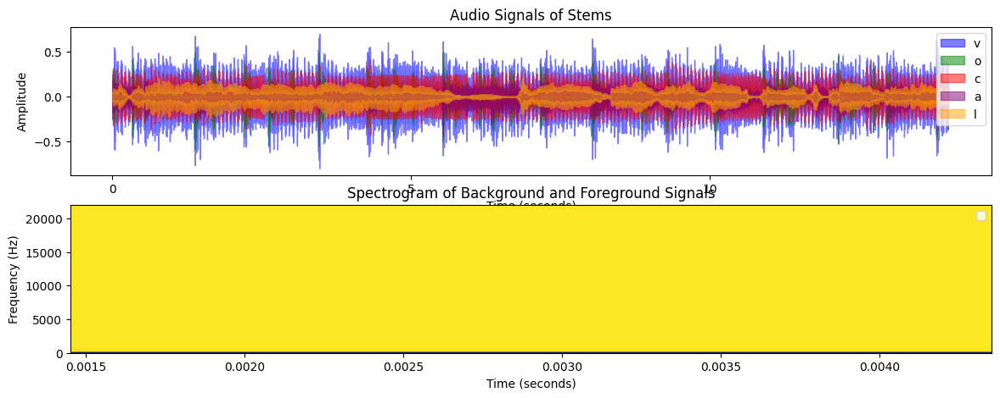

<Figure size 640x480 with 0 Axes>

In [174]:
import librosa.display
import matplotlib.pyplot as plt
from IPython.display import Audio, display
import ipywidgets as widgets  # Import the widgets module


names = ['mix', 'drums', 'bass', 'others', 'vocal']

### loading stems (mix, drums, bass, others, vocals)
def load_audio_data(file_path):
    audio, sr = librosa.load(file_path, sr=None, mono=False)
    return(audio, sr)

mix, sr = load_audio_data('/kaggle/working/audio/mix.wav')

drums, sr = load_audio_data('/kaggle/working/audio/drums.wav')

bass, sr = load_audio_data('/kaggle/working/audio/bass.wav')

others, sr = load_audio_data('/kaggle/working/audio/others.wav')

vocals, sr = load_audio_data('/kaggle/working/audio/vocal.wav')

    
### Plot the audio signal of each stem in a different color in one subplot
plt.figure(figsize=(14, 5))
plt.subplot(2, 1, 1)

### Plotting each stem with a different color
colors = ['blue', 'green', 'red', 'purple', 'orange']
for i, stem in enumerate([mix, drums, bass, others, vocals]):
    stems_name = name[i]
    librosa.display.waveshow(stem, alpha=0.5, color=colors[i], label=stems_name)

plt.title('Audio Signals of Stems')
plt.legend()
plt.xlabel('Time (seconds)')
plt.ylabel('Amplitude')



plt.subplot(2, 1, 2)
sampling_frequency = sr
# Plotting the spectrogram of the background signal in blue
plt.specgram(vocals, Fs=sampling_frequency)

# Plotting the spectrogram of the foreground signal in orange
plt.specgram(drums, Fs=sampling_frequency, alpha=0.7)

plt.specgram(mix, Fs=sampling_frequency, alpha=0.7)

plt.specgram(bass, Fs=sampling_frequency, alpha=0.7)

plt.specgram(others, Fs=sampling_frequency, alpha=0.7)
plt.title('Spectrogram of Background and Foreground Signals')
plt.xlabel('Time (seconds)')
plt.ylabel('Frequency (Hz)')
plt.legend()
plt.show()


# Plot the stems as time-frequency masks in a second subplot

# for i, stem in enumerate([mix, drums, bass, others, vocals]):
# #     Zxx = librosa.stft(stem)
#     librosa.display.specshow(librosa.amplitude_to_db(np.abs(librosa.stft(stem)), ref=np.max), sr=sr, x_axis='time', y_axis='log', cmap='viridis', alpha=0.8)

# plt.title('Time-Frequency Masks of Stems')
# plt.xlabel('Time (seconds)')
# plt.ylabel('Frequency (Hz)')
# plt.colorbar(format='%+2.0f dB')

plt.tight_layout()
plt.show()




In [194]:
def audio_player(mix, drums, bass, others, vocals):
   
    print("i m inside audio_player")

    mix_checkbox = widgets.Checkbox(value=True, description='Mix')
    drums_checkbox = widgets.Checkbox(value=True, description='Drums')
    bass_checkbox = widgets.Checkbox(value=True, description='Bass')
    others_checkbox = widgets.Checkbox(value=True, description='Others')
    vocals_checkbox = widgets.Checkbox(value=True, description='Vocals')

    checkboxes = [mix_checkbox, drums_checkbox, bass_checkbox, others_checkbox, vocals_checkbox]

    for checkbox in checkboxes:
        checkbox.observe(callback, names='value')
    display(widgets.VBox(checkboxes))
    
def callback(change):
        print("i m inside callback")
        mix_volume = 1.0 if mix_checkbox.value else 0.0
        drums_volume = 1.0 if drums_checkbox.value else 0.0
        bass_volume = 1.0 if bass_checkbox.value else 0.0
        others_volume = 1.0 if others_checkbox.value else 0.0
        vocals_volume = 1.0 if vocals_checkbox.value else 0.0

        mix_audio = mix_volume * mix
        drums_audio = drums_volume * drums
        bass_audio = bass_volume * bass
        others_audio = others_volume * others
        vocals_audio = vocals_volume * vocals

        combined_audio = mix_audio + drums_audio + bass_audio + others_audio + vocals_audio
        
        display(Audio(data=combined_audio, rate=sr))

    
audio_player(mix, drums, bass, others, vocals)


i m inside audio_player


In [210]:
import ipywidgets as widgets
from IPython.display import display, Audio, clear_output
import numpy as np

audio_data_1 = drums  
audio_data_2 = bass  
audio_data_3 = others 
audio_data_4 = vocals  

### Create checkboxes for muting each audio file
checkbox_1 = widgets.Checkbox(value=False, description='Drums')
checkbox_2 = widgets.Checkbox(value=False, description='Bass')
checkbox_3 = widgets.Checkbox(value=False, description='Other')
checkbox_4 = widgets.Checkbox(value=False, description='Vocals')

### Create volume sliders for each audio file
volume_slider_1 = widgets.FloatSlider(value=1.0, min=0.0, max=1.0, step=0.01, description='Drums Volume')
volume_slider_2 = widgets.FloatSlider(value=1.0, min=0.0, max=1.0, step=0.01, description='Bass Volume')
volume_slider_3 = widgets.FloatSlider(value=1.0, min=0.0, max=1.0, step=0.01, description='Others Volume')
volume_slider_4 = widgets.FloatSlider(value=1.0, min=0.0, max=1.0, step=0.01, description='Vocals Volume')

### Function to update audio display based on checkbox and volume values
def update_audio(change):
    clear_output(wait=True)
    
    ### Apply volume to audio data
    audio_1 = audio_data_1 * volume_slider_1.value if checkbox_1.value else np.zeros_like(audio_data_1)
    audio_2 = audio_data_2 * volume_slider_2.value if checkbox_2.value else np.zeros_like(audio_data_2)
    audio_3 = audio_data_3 * volume_slider_3.value if checkbox_3.value else np.zeros_like(audio_data_3)
    audio_4 = audio_data_4 * volume_slider_4.value if checkbox_4.value else np.zeros_like(audio_data_4)
    
    ### Combine audio data
    combined_audio = audio_1 + audio_2 + audio_3 + audio_4
    
    ### Display the combined audio
    display(Audio(combined_audio, rate=44100))

### Attach the update function to checkbox and volume slider events
checkbox_1.observe(update_audio, names='value')
checkbox_2.observe(update_audio, names='value')
checkbox_3.observe(update_audio, names='value')
checkbox_4.observe(update_audio, names='value')
volume_slider_1.observe(update_audio, names='value')
volume_slider_2.observe(update_audio, names='value')
volume_slider_3.observe(update_audio, names='value')
volume_slider_4.observe(update_audio, names='value')

### Display widgets
display(widgets.VBox([checkbox_1, volume_slider_1, checkbox_2, volume_slider_2,
                      checkbox_3, volume_slider_3, checkbox_4, volume_slider_4]))

# # Initial display
# update_audio(None)

In [213]:
# Initial display
update_audio(None)